In [1]:
import rnavigate as rnav
import pandas as pd


# Combining PAIR-MaP files for multi-amplicon RNA: "-pairmap.txt" files

PairMapper calculates correlated chemical events from DMS-MaP data analyzed
with ShapeMapper2. ShapeMapper2 can combine raw sequencing data from a multiple
amplicon experiment thoughtfully to create a single profile. PairMapper is
capable of analyzing this data. However, we were concerned that the areas of
overlap, and the disparity of read depth between amplicons and overlapping
regions could produce artifactual observations.

Here, we combined "-pairmap.txt" files from amplicons that were analyzed
individually in both ShapeMapper2 and PairMapper. These files contain the full
information about individual correlated mutation events, filtered and classified
by confidence.

Algorithm:

- PairMapper data from each amplicon is first reindexed to the full mRNA sequence using RNAvigate alignment features.
- Aligned PairMapper data is compared between overlapping amplicons.
  - Pairs occuring in 1 amplicon are kept.
  - If a PAIR occurs in both amplicons, the PAIR with the higher class priority is kept.
    - Primary (class 1) > secondary (class 2) > complimentary (class 0)
    - If priorities are the same, the PAIR from the 5' most amplicon is kept.
- The new data set is written to a new file with suffix "-combined-pairmap.txt"

Data sets for which this was performed:

1. No tethering hairpin (TH) control (MCS) for both replicates
2. TH inserted into 5'UTR
3. TH inserted into 5' portion of coding sequence
4. TH inserted into 3' portion of coding sequence
5. TH inserted into 3'UTR

In [2]:
def merge_amplicons(full, amp1, amp2, amp3):
    p1 = amp1.data["pairmap"]
    p2 = amp2.data["pairmap"]
    p3 = amp3.data["pairmap"]
    full_seq = full.data["pairmap"]

    columns = [col for col in p1.data.columns if col not in ["i", "j"]]

    pm_amplicons = [p1, p2, p3]
    for pm in pm_amplicons:
        pm.filter(fit_to=full_seq, all_pairs=True)
        pm.sequence = full_seq.sequence
        pm.data["i"] = pm.data["i_offset"]
        pm.data["j"] = pm.data["j_offset"]
        pm.data.sort_values(["i", "j"], inplace=True)
        if pm != p1:
            p1.data = p1.data.merge(pm.data, how="outer", on=["i", "j"], suffixes=["", "_y"], indicator=True)
            class_priority = {0: [1, 2], 2: [1], 1: []}
            for idx, row in p1.data.iterrows():
                if (row["_merge"] == "right_only") or ((row["_merge"] == "both") and (int(row["Class_y"]) in class_priority[int(row['Class'])])):
                    for col in columns:
                        p1.data.loc[idx, col] = row[col+"_y"]
            p1.data = p1.data[["i", "j"] + columns]
    p1.data = pd.concat(
        [
            p1.data[p1.data['Class']==1],
            p1.data[p1.data['Class']==2],
            p1.data[p1.data['Class']==0]
        ]
    )
    p1.data = p1.data.astype({
        'i': int,
        'j': int,
        'Statistic': float,
        'Class': int,
        'Zij': float,
        'Zi': float,
        'Zj': float,
        'Mod_Depth': int,
        'Mod_Comuts': int,
        'Unt_Depth': int,
        'Unt_Comuts': int})
    amp1.data["pairmap"].data = p1.data
    amp1.data["pairmap"].sequence = full_seq.sequence


## MCS replicate 1

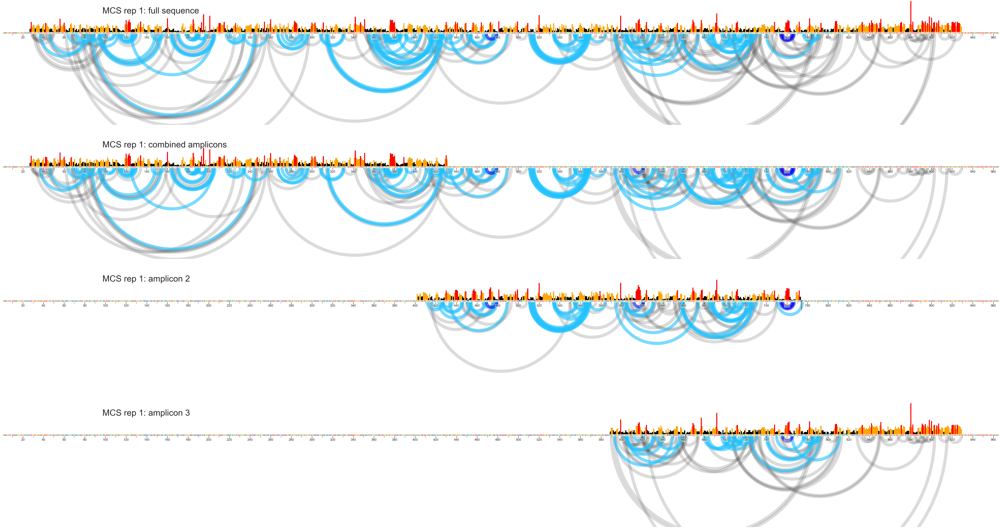

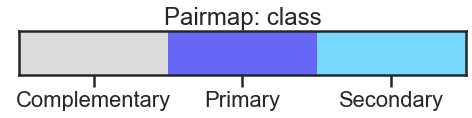

In [3]:

full = rnav.Sample(
    sample="MCS rep 1: full sequence",
    fasta="./MCS/MCS.fa",
    dmsmap="./MCS/MCS_Rep1_MCS_profile.txt",
    pairmap="./MCS/MCS-Rep1-pairmap.txt")
amp1 = rnav.Sample(
    sample="MCS rep 1: combined amplicons",
    dmsmap="./MCS/seperate/MCS-Rep1-Primer1_MCS_primer1_profile.txt",
    pairmap="./MCS/seperate/MCS-Rep1-Primer1-pairmap.txt")

amp2 = rnav.Sample(
    sample="MCS rep 1: amplicon 2",
    dmsmap="./MCS/seperate/MCS-Rep1-Primer2_MCS_primer2_profile.txt",
    pairmap="./MCS/seperate/MCS-Rep1-Primer2-pairmap.txt")

amp3 = rnav.Sample(
    sample="MCS rep 1: amplicon 3",
    dmsmap="./MCS/seperate/MCS-Rep1-Primer3_MCS_primer3_profile.txt",
    pairmap="./MCS/seperate/MCS-Rep1-Primer3-pairmap.txt")
samples = [full, amp1, amp2, amp3]

merge_amplicons(*samples)

plot = rnav.plot_arcs(
    samples,
    seq_source="pairmap",
    ct=None,
    interactions="pairmap",
    interactions_filter={"all_pairs": True},
    profile_scale_factor=10,
    plot_kwargs={"rows": 4}
)
for ax in plot.axes[:, 0]:
    ax.set(ylim=(-90, 30))
plot.set_figure_size()

amp1.data["pairmap"].print_new_file("./MCS/MCS-Rep1_combined-pairmap.txt")


## MCS replicate 2

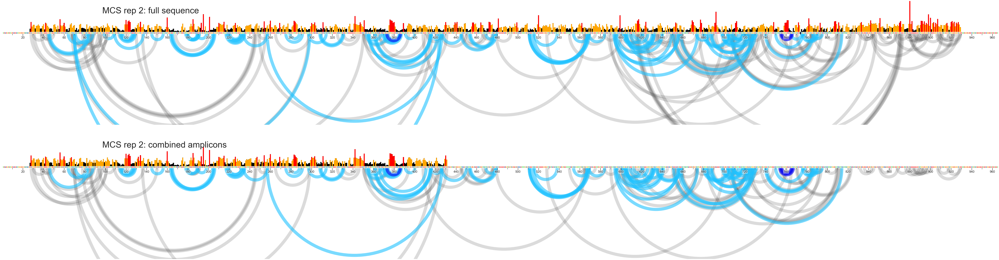

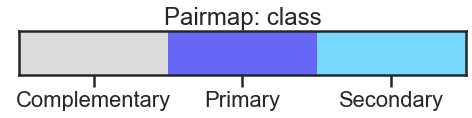

In [4]:

full = rnav.Sample(
    sample="MCS rep 2: full sequence",
    fasta="./MCS/MCS.fa",
    dmsmap="./MCS/MCS_Rep2_MCS_profile.txt",
    pairmap="./MCS/MCS-Rep2-pairmap.txt")
amp1 = rnav.Sample(
    sample="MCS rep 2: combined amplicons",
    dmsmap="./MCS/seperate/MCS-Rep2-Primer1_MCS_primer1_profile.txt",
    pairmap="./MCS/seperate/MCS-Rep2-Primer1-pairmap.txt")

amp2 = rnav.Sample(
    sample="MCS rep 2: amplicon 2",
    dmsmap="./MCS/seperate/MCS-Rep2-Primer2_MCS_primer2_profile.txt",
    pairmap="./MCS/seperate/MCS-Rep2-Primer2-pairmap.txt")

amp3 = rnav.Sample(
    sample="MCS rep 2: amplicon 3",
    dmsmap="./MCS/seperate/MCS-Rep2-Primer3_MCS_primer3_profile.txt",
    pairmap="./MCS/seperate/MCS-Rep2-Primer3-pairmap.txt")
samples = [full, amp1, amp2, amp3]

merge_amplicons(*samples)
plot = rnav.plot_arcs(
    samples[:2],
    seq_source="pairmap",
    ct=None,
    interactions="pairmap",
    interactions_filter={"all_pairs": True},
    profile_scale_factor=10,
    plot_kwargs={"rows": 2}
)
for ax in plot.axes[:, 0]:
    ax.set(ylim=(-90, 30))
plot.set_figure_size()

amp1.data["pairmap"].print_new_file("./MCS/MCS-Rep2_combined-pairmap.txt")


## 5UTR

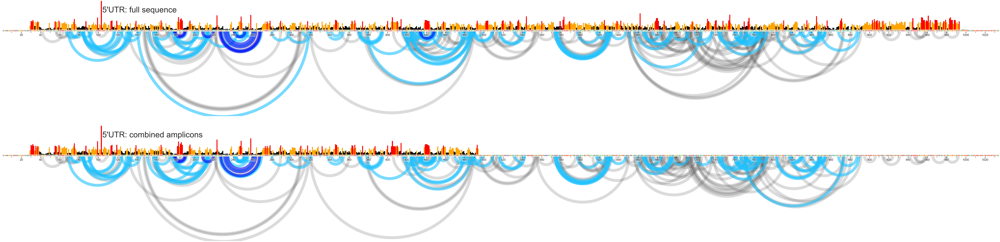

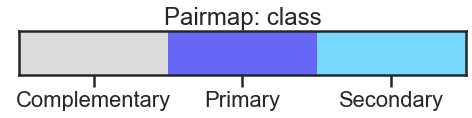

In [5]:

full = rnav.Sample(
    sample="5'UTR: full sequence",
    fasta="./5UTR/5UTR.fa",
    dmsmap="./5UTR/5UTR_5UTR_profile.txt",
    pairmap="./5UTR/5UTR-pairmap.txt")
amp1 = rnav.Sample(
    sample="5'UTR: combined amplicons",
    dmsmap="./5UTR/seperate/5UTR_Primer1_5UTR_primer1_profile.txt",
    pairmap="./5UTR/seperate/5UTR_Primer1-pairmap.txt")

amp2 = rnav.Sample(
    sample="5'UTR: amplicon 2",
    dmsmap="./5UTR/seperate/5UTR_Primer2_5UTR_primer2_profile.txt",
    pairmap="./5UTR/seperate/5UTR_Primer2-pairmap.txt")

amp3 = rnav.Sample(
    sample="5'UTR: amplicon 3",
    dmsmap="./5UTR/seperate/5UTR_Primer3_5UTR_primer3_profile.txt",
    pairmap="./5UTR/seperate/5UTR_Primer3-pairmap.txt")
samples = [full, amp1, amp2, amp3]

merge_amplicons(*samples)
plot = rnav.plot_arcs(
    samples[:2],
    seq_source="pairmap",
    ct=None,
    interactions="pairmap",
    interactions_filter={"all_pairs": True},
    profile_scale_factor=10,
    plot_kwargs={"rows": 2}
)
for ax in plot.axes[:, 0]:
    ax.set(ylim=(-90, 30))
plot.set_figure_size()

amp1.data["pairmap"].print_new_file("./5UTR/5UTR_combined-pairmap.txt")


## 3'UTR

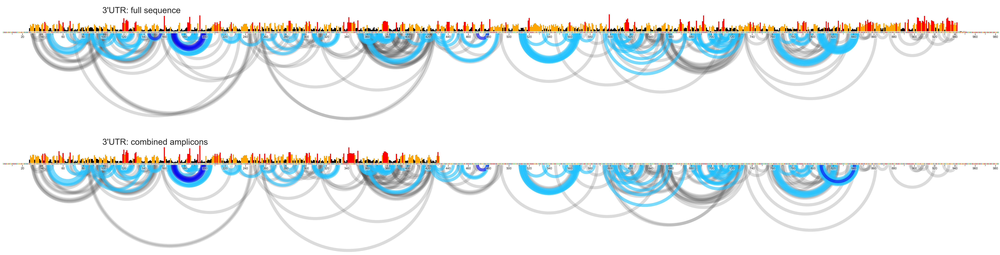

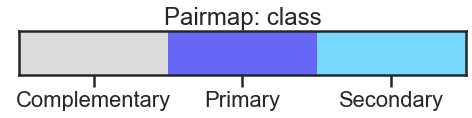

In [6]:

full = rnav.Sample(
    sample="3'UTR: full sequence",
    fasta="./3UTR/3UTR.fa",
    dmsmap="./3UTR/3UTR_3UTR_profile.txt",
    pairmap="./3UTR/3UTR-pairmap.txt")
amp1 = rnav.Sample(
    sample="3'UTR: combined amplicons",
    dmsmap="./3UTR/seperate/3UTR_Primer1_3UTR_primer1_profile.txt",
    pairmap="./3UTR/seperate/3UTR_Primer1-pairmap.txt")

amp2 = rnav.Sample(
    sample="3'UTR: amplicon 2",
    dmsmap="./3UTR/seperate/3UTR_Primer2_3UTR_primer2_profile.txt",
    pairmap="./3UTR/seperate/3UTR_Primer2-pairmap.txt")

amp3 = rnav.Sample(
    sample="3'UTR: amplicon 3",
    dmsmap="./3UTR/seperate/3UTR_Primer3_3UTR_primer3_profile.txt",
    pairmap="./3UTR/seperate/3UTR_Primer3-pairmap.txt")
samples = [full, amp1, amp2, amp3]

merge_amplicons(*samples)
plot = rnav.plot_arcs(
    samples[:2],
    seq_source="pairmap",
    ct=None,
    interactions="pairmap",
    interactions_filter={"all_pairs": True},
    profile_scale_factor=10,
    plot_kwargs={"rows": 2}
)
for ax in plot.axes[:, 0]:
    ax.set(ylim=(-90, 30))
plot.set_figure_size()

amp1.data["pairmap"].print_new_file("./3UTR/3UTR_combined-pairmap.txt")


## CDS 1

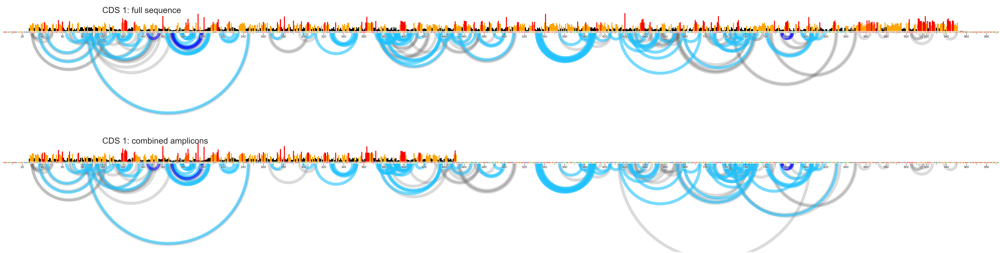

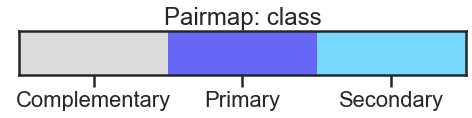

In [7]:

full = rnav.Sample(
    sample="CDS 1: full sequence",
    fasta="./CDS1/CDS1.fa",
    dmsmap="./CDS1/CDS1_CDS1_profile.txt",
    pairmap="./CDS1/CDS1-pairmap.txt")
amp1 = rnav.Sample(
    sample="CDS 1: combined amplicons",
    dmsmap="./CDS1/seperate/CDS1_Primer1_CDS1_primer1_profile.txt",
    pairmap="./CDS1/seperate/CDS1_Primer1-pairmap.txt")

amp2 = rnav.Sample(
    sample="CDS 1: amplicon 2",
    dmsmap="./CDS1/seperate/CDS1_Primer2_CDS1_primer2_profile.txt",
    pairmap="./CDS1/seperate/CDS1_Primer2-pairmap.txt")

amp3 = rnav.Sample(
    sample="CDS 1: amplicon 3",
    dmsmap="./CDS1/seperate/CDS1_Primer3_CDS1_primer3_profile.txt",
    pairmap="./CDS1/seperate/CDS1_Primer3-pairmap.txt")
samples = [full, amp1, amp2, amp3]

merge_amplicons(*samples)
plot = rnav.plot_arcs(
    samples[:2],
    seq_source="pairmap",
    ct=None,
    interactions="pairmap",
    interactions_filter={"all_pairs": True},
    profile_scale_factor=10,
    plot_kwargs={"rows": 2}
)
for ax in plot.axes[:, 0]:
    ax.set(ylim=(-90, 30))
plot.set_figure_size()

amp1.data["pairmap"].print_new_file("./CDS1/CDS1_combined-pairmap.txt")


## CDS 3

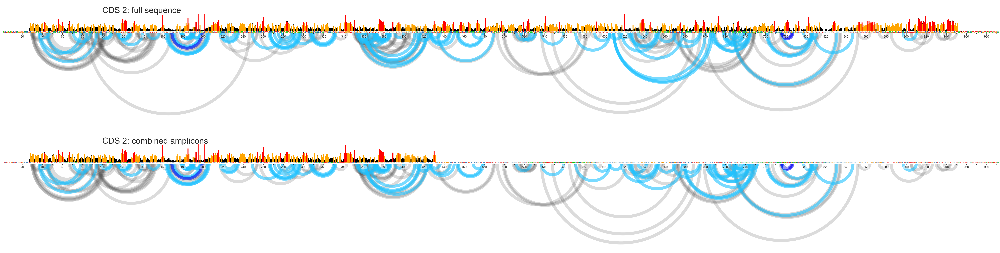

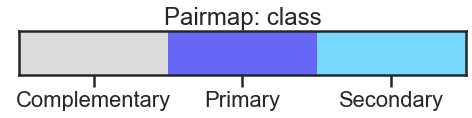

In [8]:

full = rnav.Sample(
    sample="CDS 2: full sequence",
    fasta="./CDS3/CDS3.fa",
    dmsmap="./CDS3/CDS3_CDS3_profile.txt",
    pairmap="./CDS3/CDS3-pairmap.txt")
amp1 = rnav.Sample(
    sample="CDS 2: combined amplicons",
    dmsmap="./CDS3/seperate/CDS3_Primer1_CDS3_primer1_profile.txt",
    pairmap="./CDS3/seperate/CDS3_Primer1-pairmap.txt")

amp2 = rnav.Sample(
    sample="CDS 2: amplicon 2",
    dmsmap="./CDS3/seperate/CDS3_Primer2_CDS3_primer2_profile.txt",
    pairmap="./CDS3/seperate/CDS3_Primer2-pairmap.txt")

amp3 = rnav.Sample(
    sample="CDS 2: amplicon 3",
    dmsmap="./CDS3/seperate/CDS3_Primer3_CDS3_primer3_profile.txt",
    pairmap="./CDS3/seperate/CDS3_Primer3-pairmap.txt")
samples = [full, amp1, amp2, amp3]

merge_amplicons(*samples)
plot = rnav.plot_arcs(
    samples[:2],
    seq_source="pairmap",
    ct=None,
    interactions="pairmap",
    interactions_filter={"all_pairs": True},
    profile_scale_factor=10,
    plot_kwargs={"rows": 2}
)
for ax in plot.axes[:, 0]:
    ax.set(ylim=(-90, 30))
plot.set_figure_size()

amp1.data["pairmap"].print_new_file("./CDS3/CDS3_combined-pairmap.txt")
